# A. Cluster your data

In [61]:
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import numpy as np
import seaborn as sns
from scipy import stats
from sklearn.cluster import KMeans, DBSCAN
from collections import Counter
from sklearn import metrics
from scipy.spatial.distance import cdist 
from sklearn.preprocessing import normalize
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.preprocessing import MinMaxScaler
import statsmodels.api as sm
from sklearn import preprocessing
from sklearn import linear_model
from sklearn.cross_validation import train_test_split
from sklearn.linear_model import LogisticRegression, Lasso, Ridge, ElasticNet, SGDRegressor
from sklearn.cross_validation import KFold,cross_val_score,train_test_split
from sklearn.linear_model import LinearRegression

# Data Cleaning 

In [62]:
plt.rcParams['figure.figsize'] = (10,8)
df = pd.read_csv("billboard.csv")

print(df.head())

print(df.shape)

        title                               artist  weeks  rank  popularity  \
0  God's Plan                                Drake      3     1         100   
1     Perfect                           Ed Sheeran     24     2          98   
2     Finesse                 Bruno Mars & Cardi B      6     3          98   
3      Havana  Camila Cabello Featuring Young Thug     26     4          98   
4    Rockstar      Post Malone Featuring 21 Savage     21     5          95   

   danceability  energy  key  loudness  mode  speechiness  acousticness  \
0         0.753   0.454    7    -9.488     1       0.0963        0.0244   
1         0.599   0.448    8    -6.312     1       0.0232        0.1630   
2         0.704   0.859    5    -4.877     0       0.0996        0.0185   
3         0.765   0.523    2    -4.333     1       0.0300        0.1840   
4         0.580   0.531    5    -6.631     0       0.0776        0.1280   

   instrumentalness  liveness  valence    tempo speech        date  
0    

In [64]:
df.describe()

,weeks,rank,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
count,10099.000000,10099.000000,10099.000000,10099.000000,10099.000000,10099.000000,10099.000000,10099.000000,10099.000000,10099.000000,10099.000000,10099.000000,10099.000000,10099.000000
mean,12.332607,50.498762,79.070304,0.678802,0.636718,5.408456,-6.277348,0.606595,0.118897,0.172661,0.004497,0.158905,0.483462,119.208874
std,9.920090,28.868660,9.501478,0.136469,0.159773,3.706665,2.203038,0.488530,0.110754,0.193738,0.031075,0.107963,0.212330,28.972307
min,1.000000,1.000000,10.000000,0.000000,0.000020,0.000000,-16.998000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5.000000,25.500000,74.000000,0.596000,0.532000,1.000000,-7.390000,0.000000,0.043200,0.029300,0.000000,0.094400,0.321000,95.093000
50%,10.000000,50.000000,79.000000,0.681000,0.640000,6.000000,-5.871000,1.000000,0.070300,0.096900,0.000000,0.119000,0.473000,117.020000
75%,17.000000,75.500000,85.000000,0.771000,0.769000,9.000000,-4.804000,1.000000,0.146000,0.242000,0.000007,0.179000,0.656000,140.064000
max,57.000000,100.000000,100.000000,0.981000,0.966000,11.000000,-1.075000,1.000000,0.765000,0.968000,0.852000,0.874000,0.966000,202.082000


In [65]:
df.duplicated().sum()

900

In [66]:
df=df.drop_duplicates()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9199 entries, 0 to 10098
Data columns (total 18 columns):
title               9199 non-null object
artist              9199 non-null object
weeks               9199 non-null int64
rank                9199 non-null int64
popularity          9199 non-null int64
danceability        9199 non-null float64
energy              9199 non-null float64
key                 9199 non-null int64
loudness            9199 non-null float64
mode                9199 non-null int64
speechiness         9199 non-null float64
acousticness        9199 non-null float64
instrumentalness    9199 non-null float64
liveness            9199 non-null float64
valence             9199 non-null float64
tempo               9199 non-null float64
speech              9199 non-null object
date                9199 non-null object
dtypes: float64(9), int64(5), object(4)
memory usage: 1.3+ MB


In [67]:
df_bak=df.copy()

In [68]:
columns=['title','artist','weeks','rank','instrumentalness','speech','date']
df_bak = df_bak.drop(columns, axis=1)

In [69]:
df_bak.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9199 entries, 0 to 10098
Data columns (total 11 columns):
popularity      9199 non-null int64
danceability    9199 non-null float64
energy          9199 non-null float64
key             9199 non-null int64
loudness        9199 non-null float64
mode            9199 non-null int64
speechiness     9199 non-null float64
acousticness    9199 non-null float64
liveness        9199 non-null float64
valence         9199 non-null float64
tempo           9199 non-null float64
dtypes: float64(8), int64(3)
memory usage: 862.4 KB


In [70]:
df_bak.duplicated().sum()

8272

In [71]:
df_bak=df_bak.drop_duplicates()


#plt.plot(df_bak['danceability'])

In [72]:
df_bak.isnull().sum()

popularity      0
danceability    0
energy          0
key             0
loudness        0
mode            0
speechiness     0
acousticness    0
liveness        0
valence         0
tempo           0
dtype: int64

In [73]:
df_bak.describe()
df_bak.info()
print(df_bak)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 927 entries, 0 to 10097
Data columns (total 11 columns):
popularity      927 non-null int64
danceability    927 non-null float64
energy          927 non-null float64
key             927 non-null int64
loudness        927 non-null float64
mode            927 non-null int64
speechiness     927 non-null float64
acousticness    927 non-null float64
liveness        927 non-null float64
valence         927 non-null float64
tempo           927 non-null float64
dtypes: float64(8), int64(3)
memory usage: 86.9 KB
       popularity  danceability  energy  key  loudness  mode  speechiness  \
0             100         0.753   0.454    7    -9.488     1       0.0963   
1              98         0.599   0.448    8    -6.312     1       0.0232   
2              98         0.704   0.859    5    -4.877     0       0.0996   
3              98         0.765   0.523    2    -4.333     1       0.0300   
4              95         0.580   0.531    5    -6.631  

## distribution

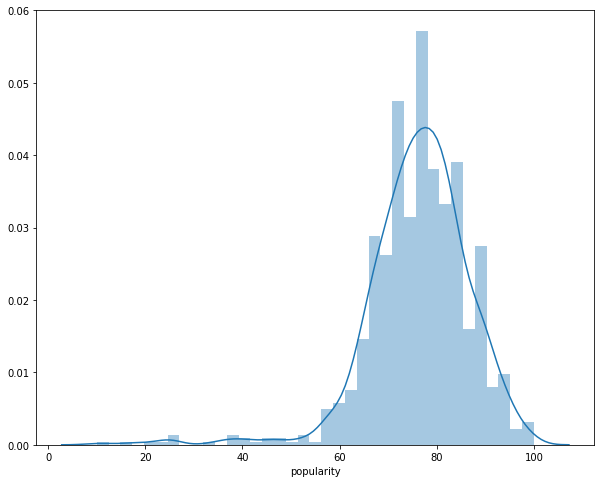

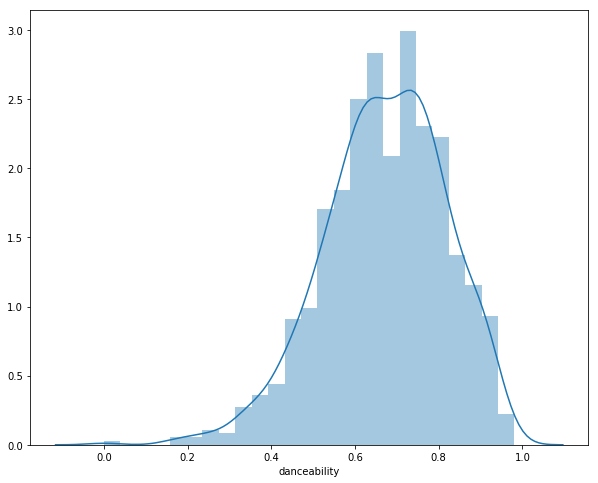

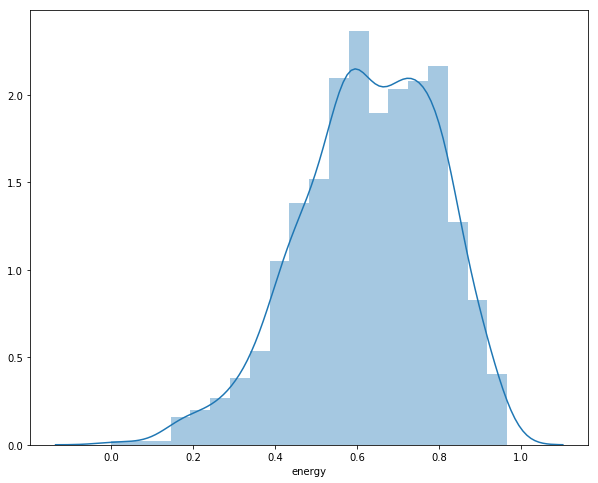

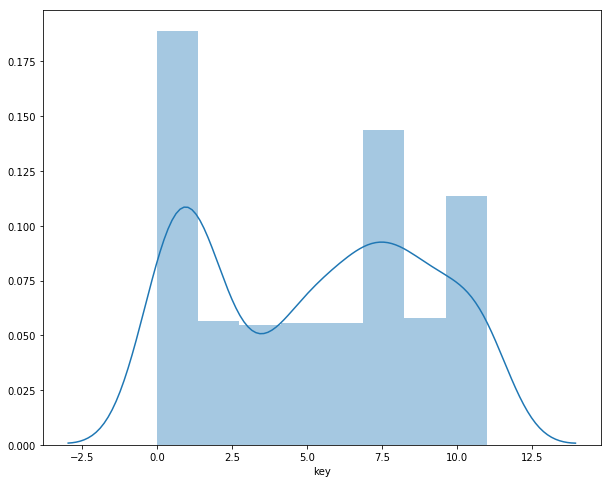

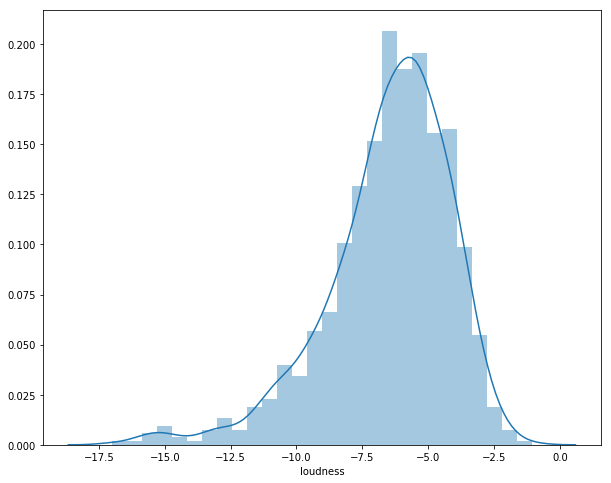

...

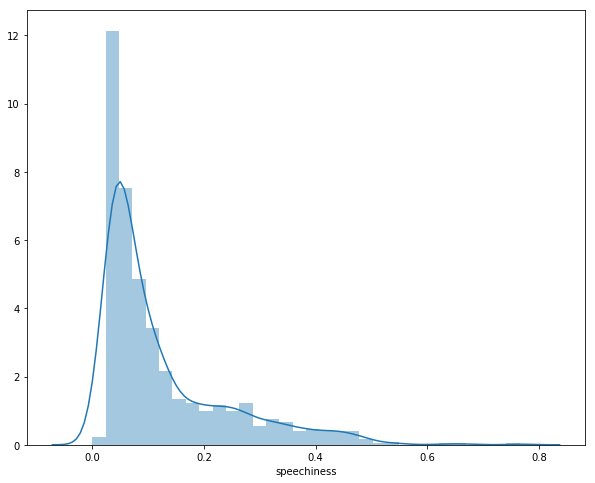

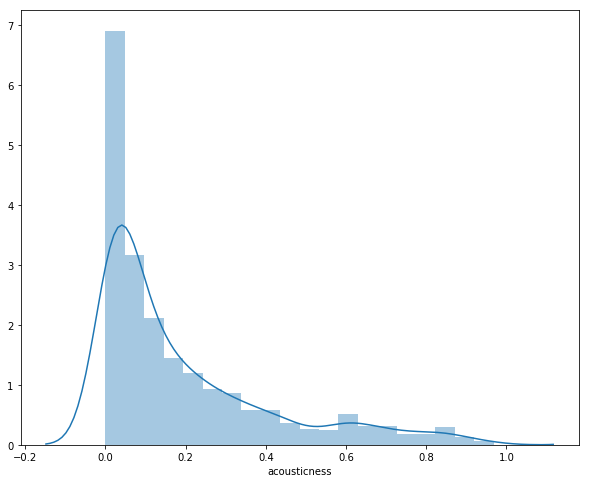

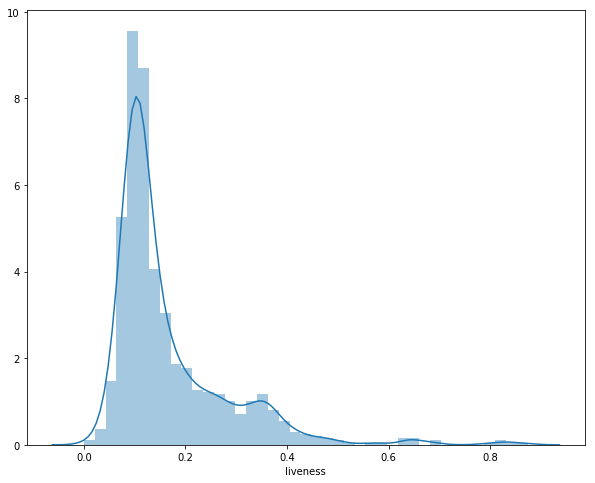

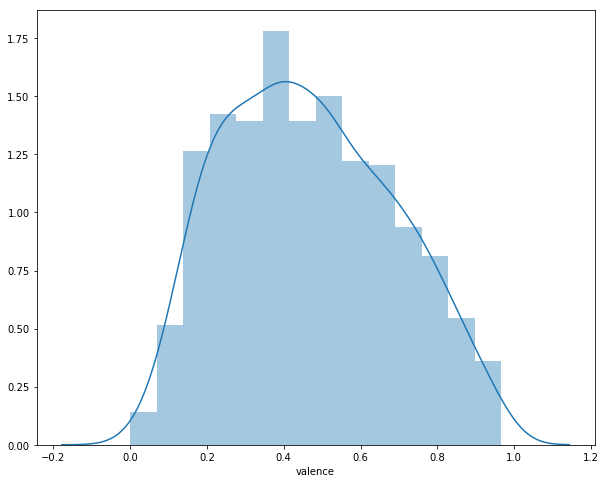

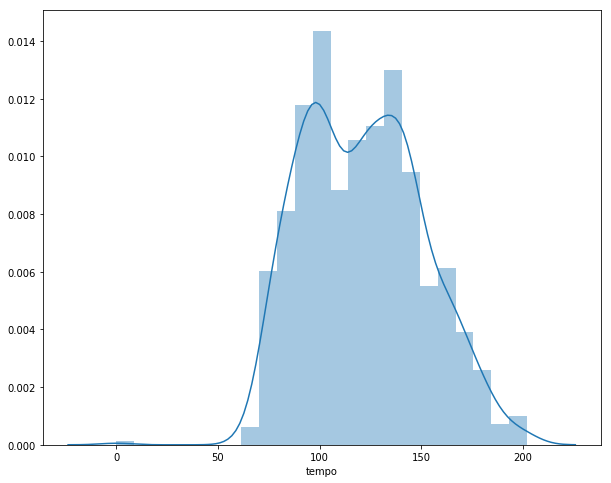

In [74]:
def show_distribution(df):
    for col in list(df.columns.values):
        sns.distplot(df[col])
        plt.show()
        
show_distribution(df_bak)


## Cluster

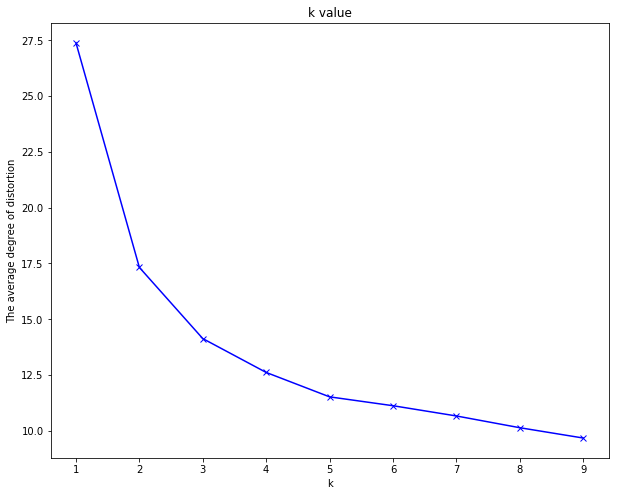

In [75]:
K = range(1, 10)  
meandistortions = [] 
for k in K:  
    kmeans = KMeans(n_clusters=k)  
    kmeans.fit(df_bak)  
    meandistortions.append(sum(np.min(cdist(df_bak, kmeans.cluster_centers_, 'euclidean'), axis=1)) / df_bak.shape[0])
plt.plot(K, meandistortions, 'bx-')  
plt.xlabel('k')  
plt.ylabel('The average degree of distortion')  
plt.title('k value'); 

#  No Scaling

### KMeans k =2

In [76]:
model = KMeans(n_clusters = 2, n_jobs = 4,max_iter=500)
model.fit(df_bak)
labels = model.labels_
#metrics.calinski_harabaz_score(data_zs,labels) 
metrics.silhouette_score(df_bak,labels,metric='euclidean')

0.49868761832018105

In [77]:
r1 = pd.Series(model.labels_).value_counts()
r2 = pd.DataFrame(model.cluster_centers_)
r = pd.concat([r2,r1],axis = 1)
r.columns = list(df_bak.columns)+["num"]
print(r)

   popularity  danceability    energy       key  loudness      mode  \
0   76.243299      0.668194  0.622495  5.309278 -6.487713  0.616495   
1   76.291855      0.674545  0.636021  5.246606 -6.531281  0.624434   

   speechiness  acousticness  liveness   valence       tempo  num  
0     0.106211      0.204560  0.157059  0.478498   98.030384  485  
1     0.142872      0.175975  0.177981  0.454220  146.969118  442  


Counter({0: 485, 1: 442})

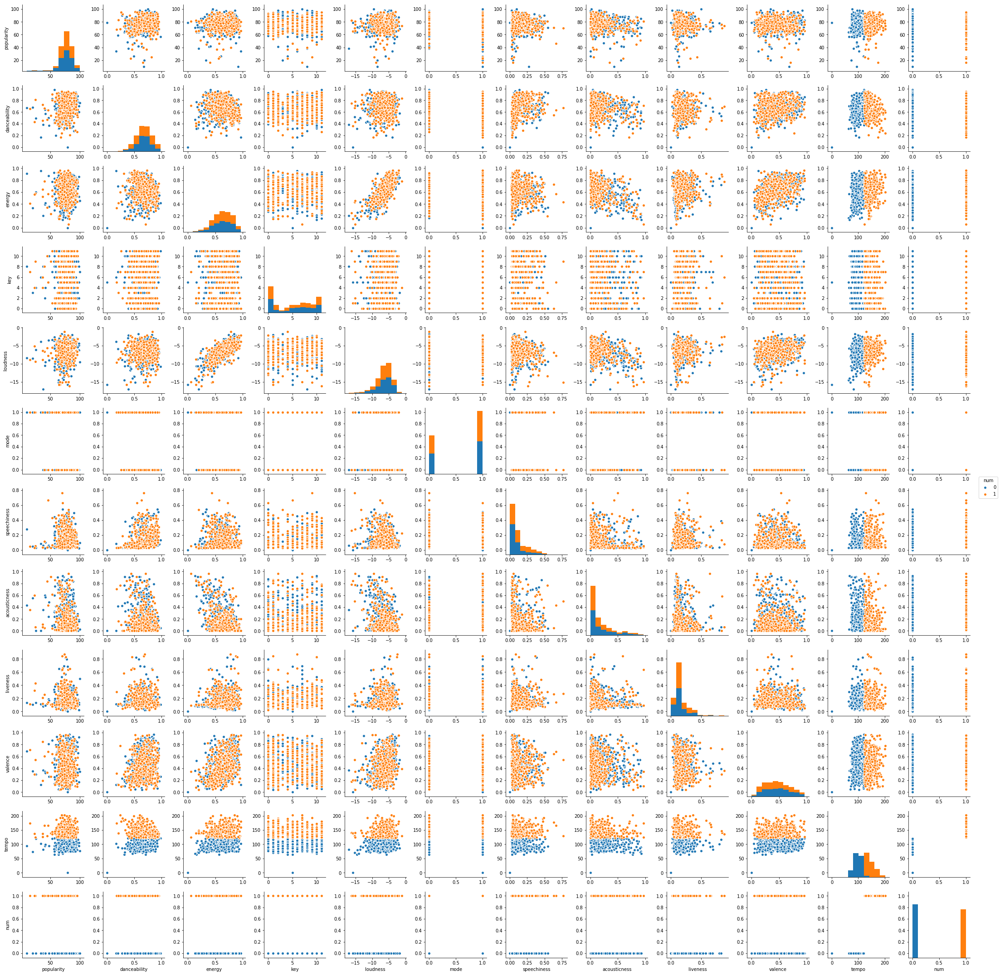

In [78]:
r = pd.concat([df_bak,pd.Series(model.labels_,index=df_bak.index)],axis=1)
r.columns=list(df_bak.columns)+["num"]
sns.pairplot(r,hue="num")
Counter(r['num'])

## After Scaling

1409.81446475
0.527269421017


Counter({0: 363, 1: 564})

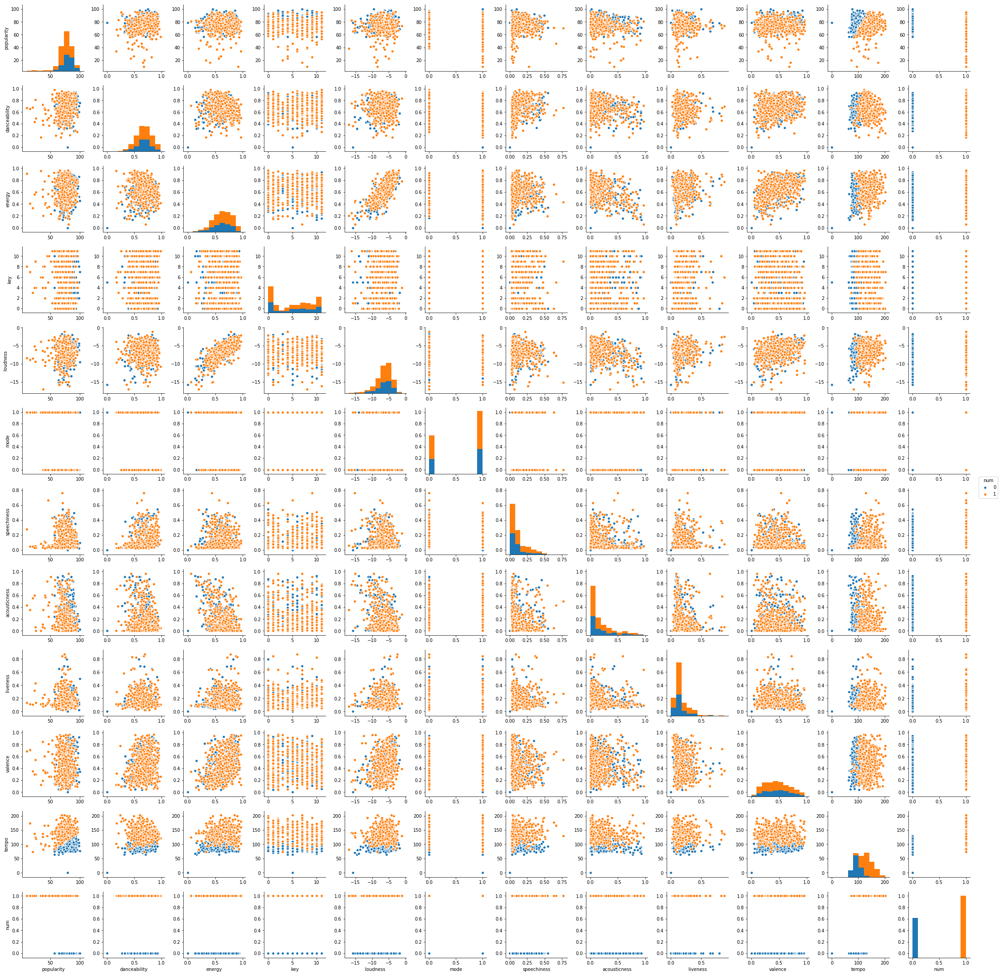

In [79]:
data = df_bak
data_zs = preprocessing.normalize(data, norm='l2')
data_zs = pd.DataFrame(data_zs)
data_zs.columns=list(data.columns)

model = KMeans(n_clusters = 2, n_jobs = 4,max_iter=500)
model.fit(data_zs)
labels = model.labels_
print(metrics.calinski_harabaz_score(data_zs,labels) )
print(metrics.silhouette_score(data_zs,labels,metric='euclidean'))

r = pd.concat([data,pd.Series(model.labels_,index=data.index)],axis=1)
r.columns=list(data.columns)+["num"]
sns.pairplot(r,hue="num")
Counter(r['num'])

### DBSCAN
#### eps = 0.02

In [80]:
db = DBSCAN(eps=5, min_samples=10).fit(df_bak)
labels = db.labels_
print(Counter(labels))

Counter({-1: 356, 0: 268, 2: 188, 1: 42, 3: 22, 7: 22, 4: 11, 5: 9, 6: 9})


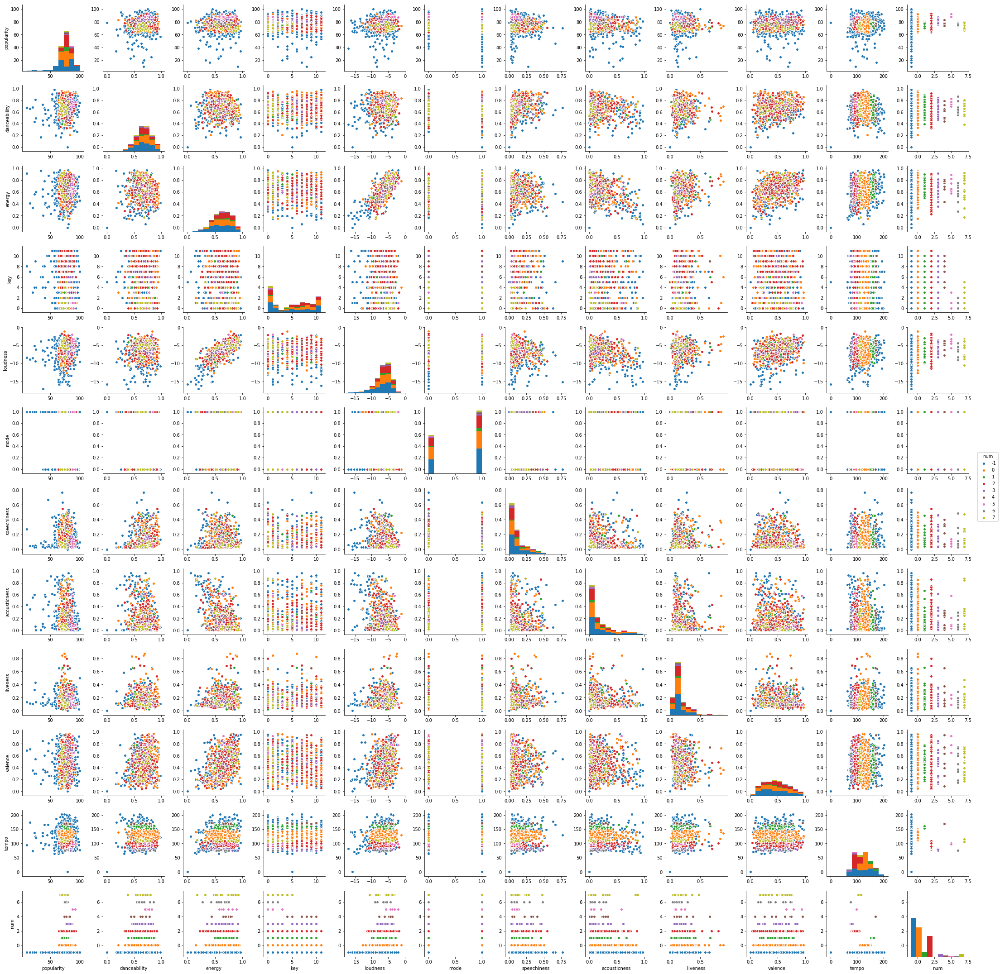

In [81]:
r = pd.concat([df_bak,pd.Series(labels,index=df_bak.index)],axis=1)
r.columns=list(df_bak.columns)+["num"]
sns.pairplot(r,hue="num")

# normalization

## 1.Min-max normalization

In [82]:
data = df_bak
scaler = MinMaxScaler()
scaler.fit(data)
data_zs=scaler.transform(data)
#data_zs = 1.0*(data - data.mean())/data.std()
data_zs= pd.DataFrame(data_zs)
data_zs.columns = list(data.columns)
data_zs.describe()

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,liveness,valence,tempo
count,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000,927.000000
mean,0.736294,0.684222,0.651074,0.479945,0.658765,0.620280,0.161688,0.197242,0.191115,0.483356,0.600572
std,0.116873,0.148881,0.173752,0.332006,0.148942,0.485579,0.150966,0.227756,0.133842,0.226492,0.145012
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.677778,0.592762,0.541398,0.090909,0.585851,0.000000,0.056928,0.030217,0.109840,0.297619,0.483076
50%,0.744444,0.689093,0.659413,0.545455,0.678264,1.000000,0.100261,0.104339,0.138444,0.467909,0.593996
75%,0.811111,0.788991,0.786745,0.727273,0.760064,1.000000,0.213072,0.285640,0.228833,0.653727,0.699412
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


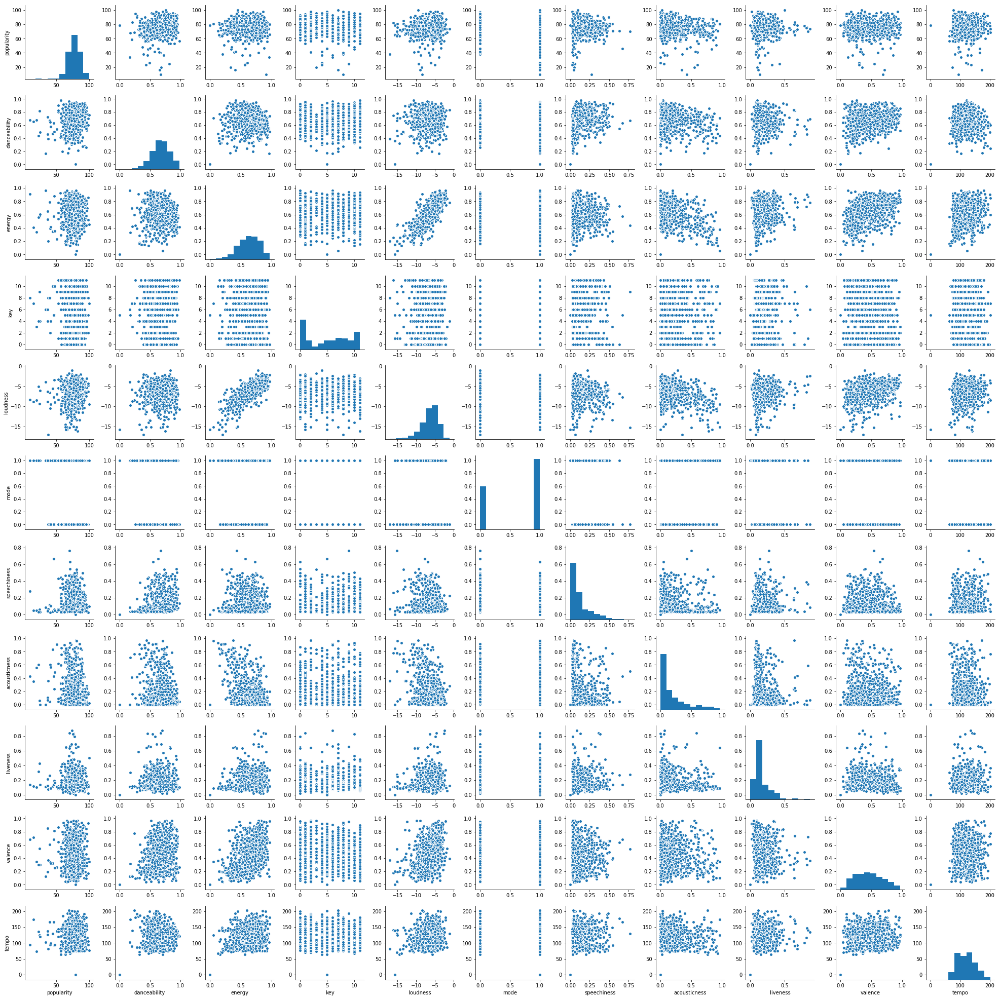

In [83]:
sns.pairplot(df_bak)

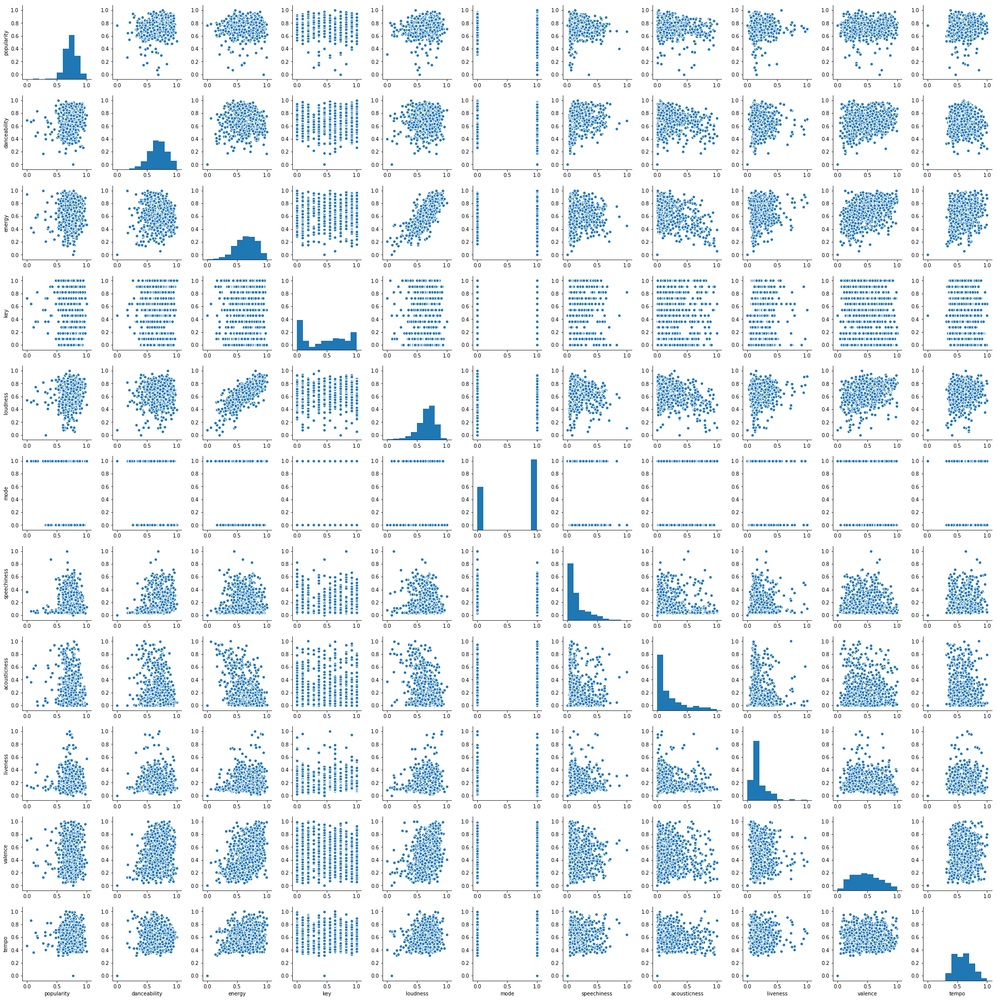

In [84]:
sns.pairplot(data_zs)

## 2.Standardization

In [85]:
data = df_bak
scaler = preprocessing.StandardScaler() 
data_zs = scaler.fit_transform(data)  
data_zs = pd.DataFrame(data_zs)
data_zs.columns=list(data.columns)
data_zs.describe()


,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,liveness,valence,tempo
count,9.270000e+02,9.270000e+02,9.270000e+02,9.270000e+02,9.270000e+02,9.270000e+02,9.270000e+02,9.270000e+02,9.270000e+02,9.270000e+02,9.270000e+02
mean,8.073369e-16,3.910632e-16,-2.533632e-16,8.302720e-17,2.799511e-16,-5.291225e-16,9.221917e-17,-1.184777e-16,-2.792924e-16,8.701687e-17,-4.591796e-16
std,1.000540e+00,1.000540e+00,1.000540e+00,1.000540e+00,1.000540e+00,1.000540e+00,1.000540e+00,1.000540e+00,1.000540e+00,1.000540e+00,1.000540e+00
min,-6.303342e+00,-4.598241e+00,-3.749161e+00,-1.446370e+00,-4.425352e+00,-1.278093e+00,-1.071598e+00,-8.664918e-01,-1.428690e+00,-2.135252e+00,-4.143761e+00
25%,-5.009509e-01,-6.146466e-01,-6.315590e-01,-1.172405e+00,-4.898124e-01,-1.278093e+00,-6.943024e-01,-7.337478e-01,-6.075780e-01,-8.205029e-01,-8.106825e-01
50%,6.977604e-02,3.273041e-02,4.802086e-02,1.974204e-01,1.309891e-01,7.824154e-01,-4.071072e-01,-4.081279e-01,-3.937467e-01,-6.823794e-02,-4.536620e-02
75%,6.405030e-01,7.040843e-01,7.812518e-01,7.453505e-01,6.804923e-01,7.824154e-01,3.405533e-01,3.883362e-01,2.819602e-01,7.526226e-01,6.819660e-01
max,2.257563e+00,2.122148e+00,2.009264e+00,1.567246e+00,2.292298e+00,7.824154e-01,5.555983e+00,3.526541e+00,6.046852e+00,2.282304e+00,2.755934e+00


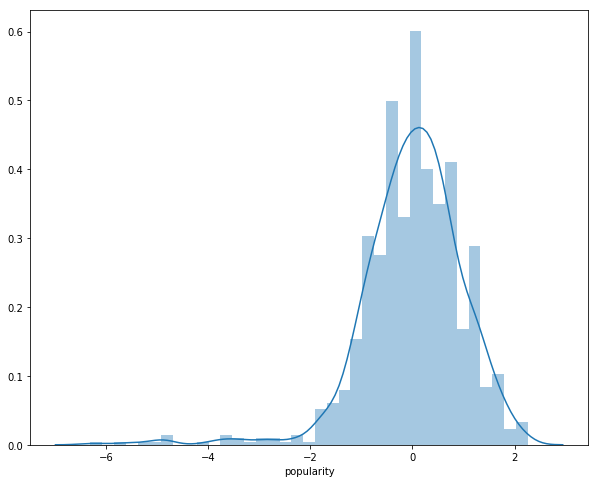

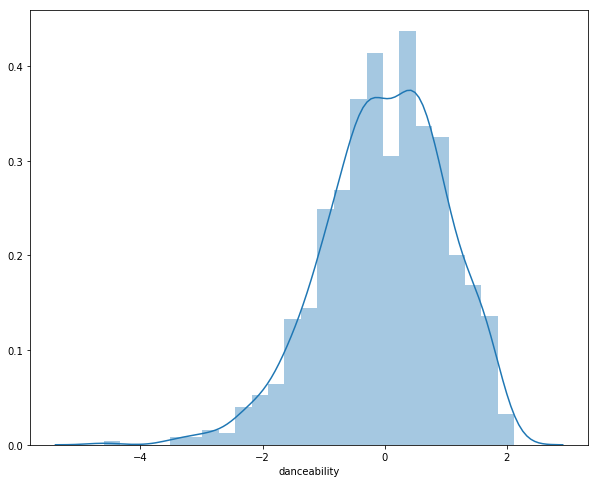

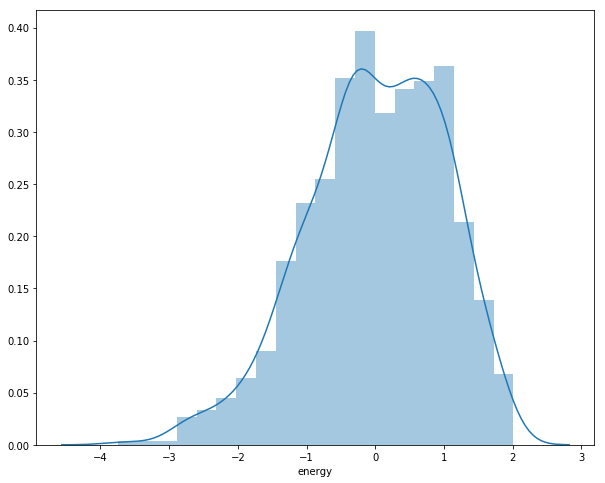

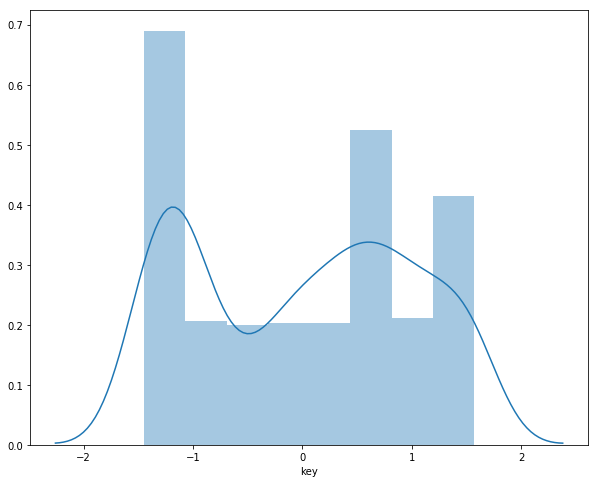

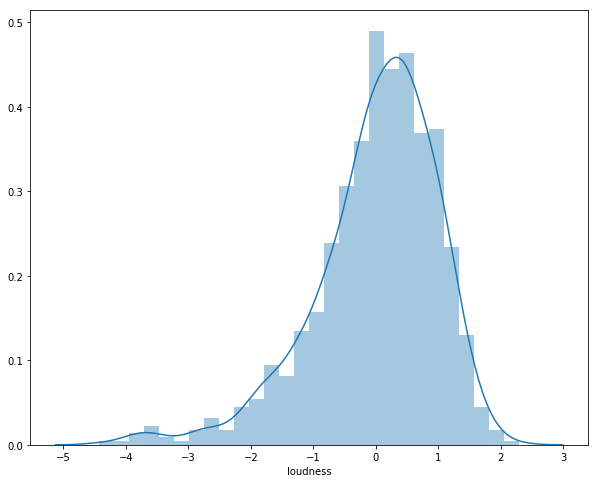

...

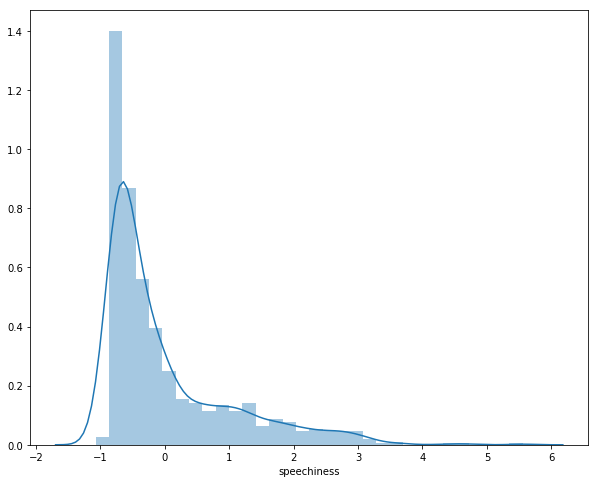

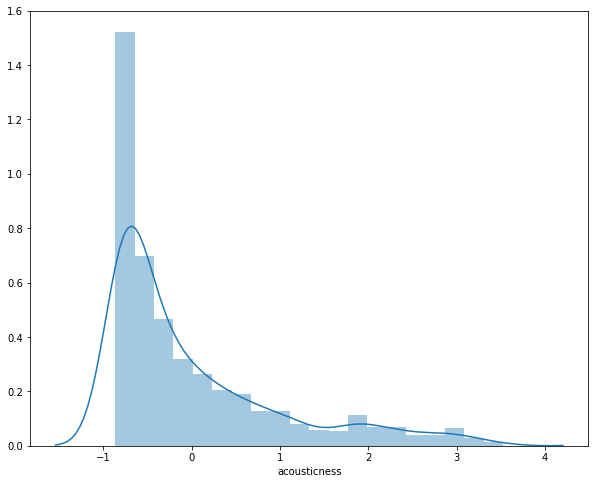

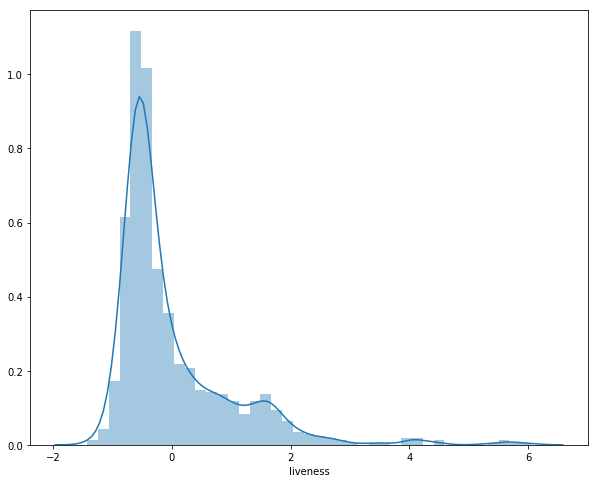

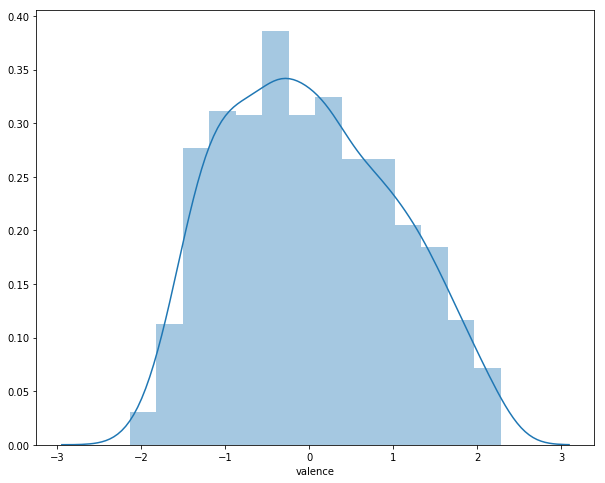

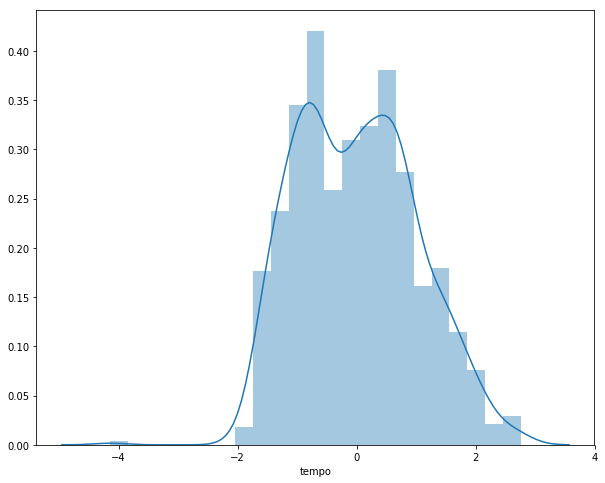

In [86]:
show_distribution(data_zs)

## 3.Normalization

In [87]:
data = df_bak
data_zs = preprocessing.normalize(data, norm='l2')
data_zs = pd.DataFrame(data_zs)
data_zs.columns=list(data.columns)

In [88]:
data_zs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 927 entries, 0 to 926
Data columns (total 11 columns):
popularity      927 non-null float64
danceability    927 non-null float64
energy          927 non-null float64
key             927 non-null float64
loudness        927 non-null float64
mode            927 non-null float64
speechiness     927 non-null float64
acousticness    927 non-null float64
liveness        927 non-null float64
valence         927 non-null float64
tempo           927 non-null float64
dtypes: float64(11)
memory usage: 79.7 KB


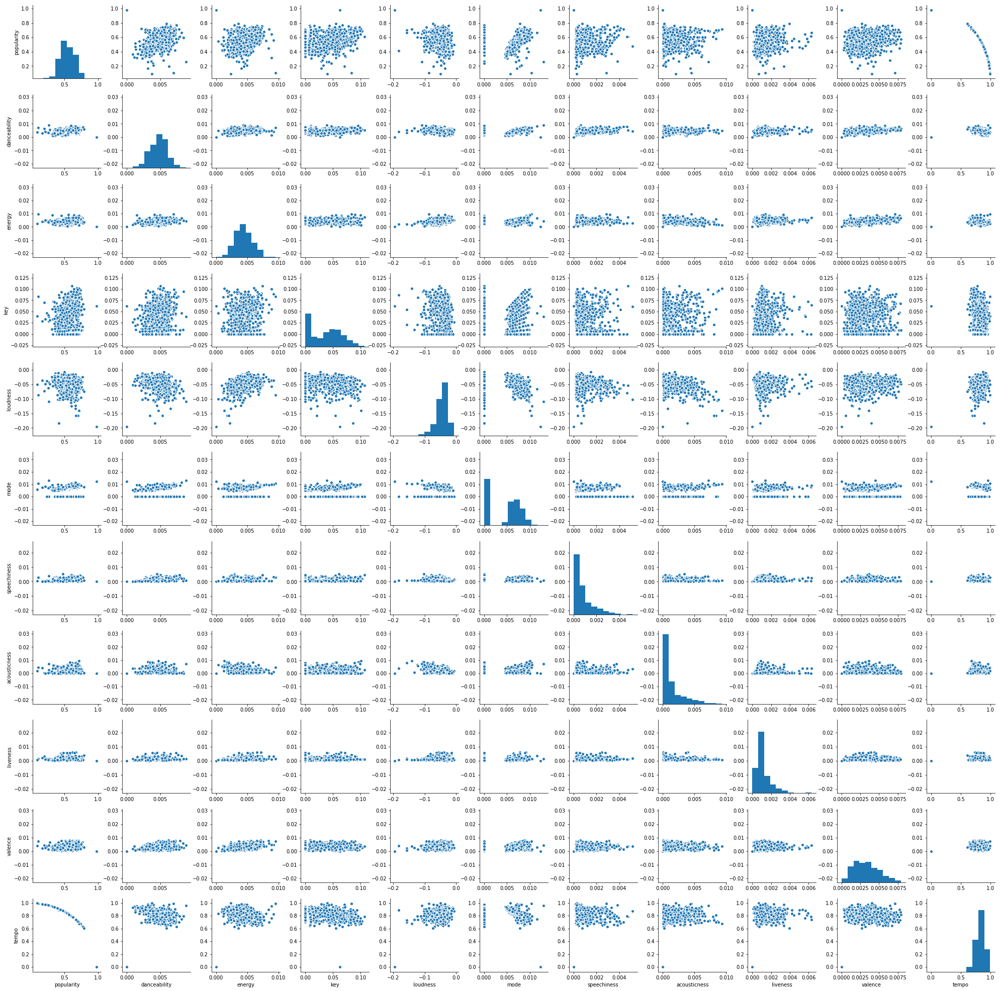

In [89]:
sns.pairplot(data_zs)

## Elbow method to determine the K value

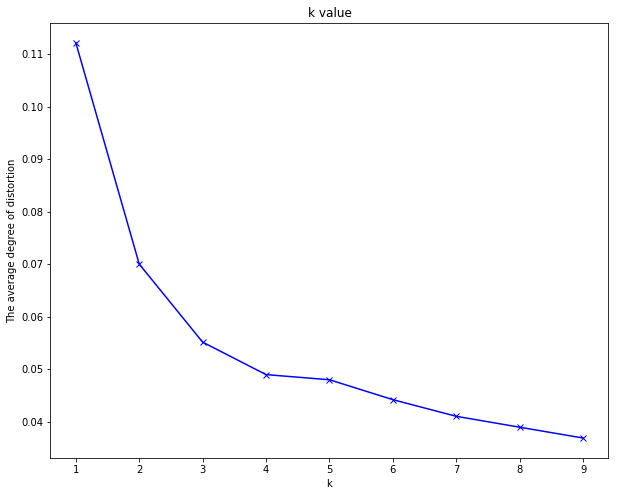

In [90]:
K = range(1, 10)  
meandistortions = [] 
for k in K:  
    kmeans = KMeans(n_clusters=k)  
    kmeans.fit(data_zs)  
    meandistortions.append(sum(np.min(cdist(data_zs, kmeans.cluster_centers_, 'euclidean'), axis=1)) / data_zs.shape[0])
plt.plot(K, meandistortions, 'bx-')  
plt.xlabel('k')  
plt.ylabel('The average degree of distortion')  
plt.title('k value'); 

## KMeans 
### k =2

In [91]:
model = KMeans(n_clusters = 2, n_jobs = 4,max_iter=500)
model.fit(data_zs)
labels = model.labels_
print(metrics.calinski_harabaz_score(data_zs,labels) )
print(metrics.silhouette_score(data_zs,labels,metric='euclidean'))

1409.81446475
0.527269421017


In [92]:
r1 = pd.Series(model.labels_).value_counts()
r2 = pd.DataFrame(model.cluster_centers_)
r = pd.concat([r2,r1],axis = 1)
r.columns = list(data_zs.columns)+["num"]
print(r)

   popularity  danceability    energy       key  loudness      mode  \
0    0.470858      0.004343  0.004109  0.034163 -0.042434  0.003988   
1    0.646147      0.005415  0.004981  0.042965 -0.053233  0.005125   

   speechiness  acousticness  liveness   valence     tempo  num  
0     0.000835      0.001210  0.001130  0.002966  0.876665  564  
1     0.000912      0.001678  0.001259  0.003866  0.754912  363  


Counter({0: 564, 1: 363})

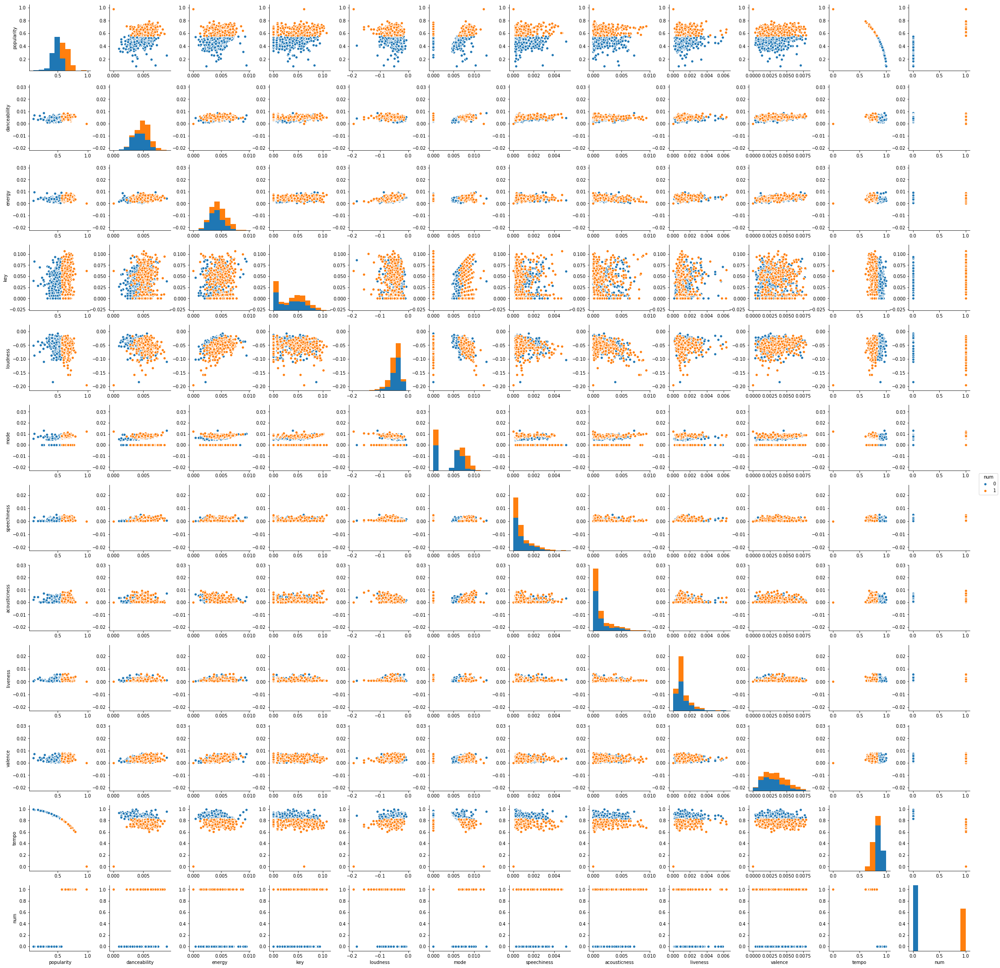

In [93]:
r = pd.concat([data_zs,pd.Series(model.labels_,index=data_zs.index)],axis=1)
r.columns=list(data_zs.columns)+["num"]
sns.pairplot(r,hue="num")
Counter(r['num'])

### k =3

In [94]:
model = KMeans(n_clusters = 3, n_jobs = 4,max_iter=500)
model.fit(data_zs)
labels = model.labels_
print(metrics.calinski_harabaz_score(data_zs,labels) )
print(metrics.silhouette_score(data_zs,labels,metric='euclidean'))

1355.93375007
0.444417344289


In [95]:
r1 = pd.Series(model.labels_).value_counts()
r2 = pd.DataFrame(model.cluster_centers_)
r = pd.concat([r2,r1],axis = 1)
r.columns = list(data.columns)+["num"]
print(r)

   popularity  danceability    energy       key  loudness      mode  \
0    0.664108      0.005477  0.005017  0.043619 -0.054453  0.005250   
1    0.413253      0.003776  0.003870  0.030070 -0.039789  0.004135   
2    0.531871      0.004894  0.004421  0.038208 -0.045509  0.004031   

   speechiness  acousticness  liveness   valence     tempo  num  
0     0.000969      0.001743  0.001253  0.003951  0.739552  284  
1     0.000861      0.001156  0.001135  0.002741  0.906580  257  
2     0.000791      0.001294  0.001157  0.003238  0.843130  386  


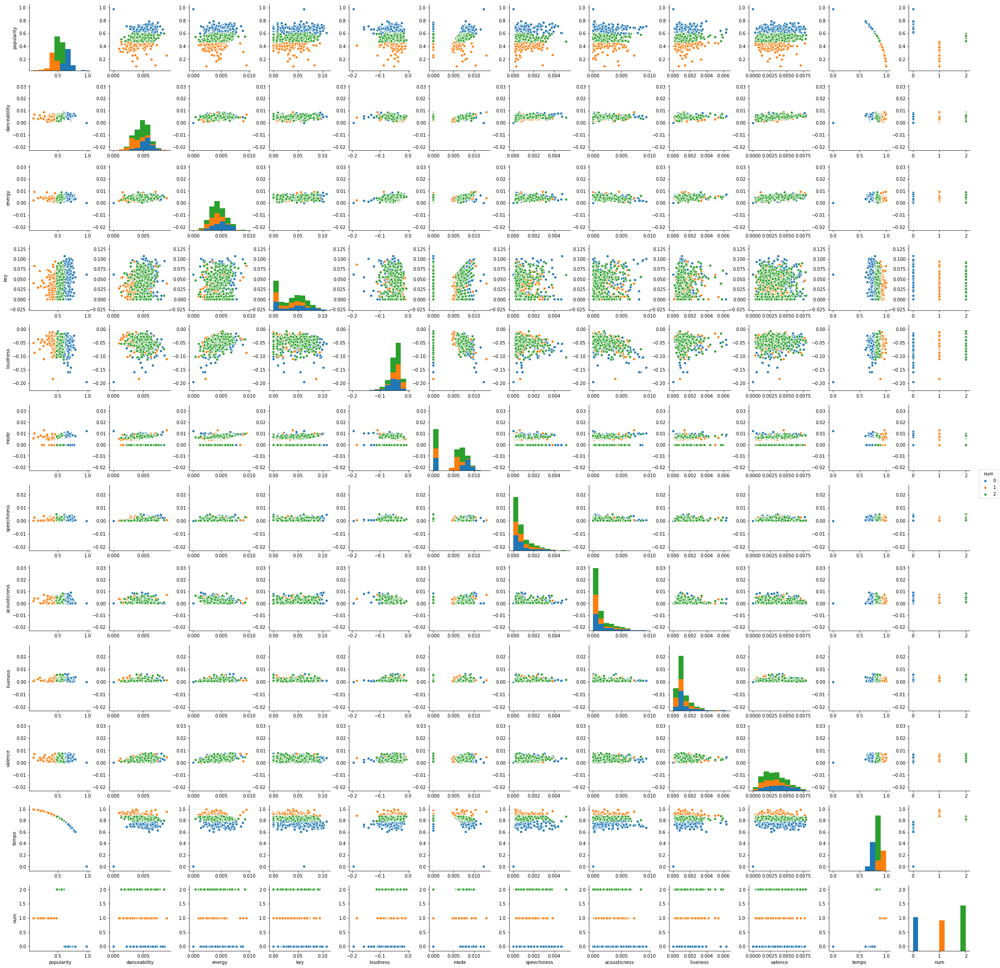

In [96]:
r = pd.concat([data_zs,pd.Series(model.labels_,index=data_zs.index)],axis=1)
r.columns=list(data_zs.columns)+["num"]
sns.pairplot(r,hue="num")

## DBSCAN
### eps = 0.02

In [97]:
db = DBSCAN(eps=0.02, min_samples=10).fit(data_zs)
labels = db.labels_
print(Counter(labels))

Counter({0: 708, -1: 219})


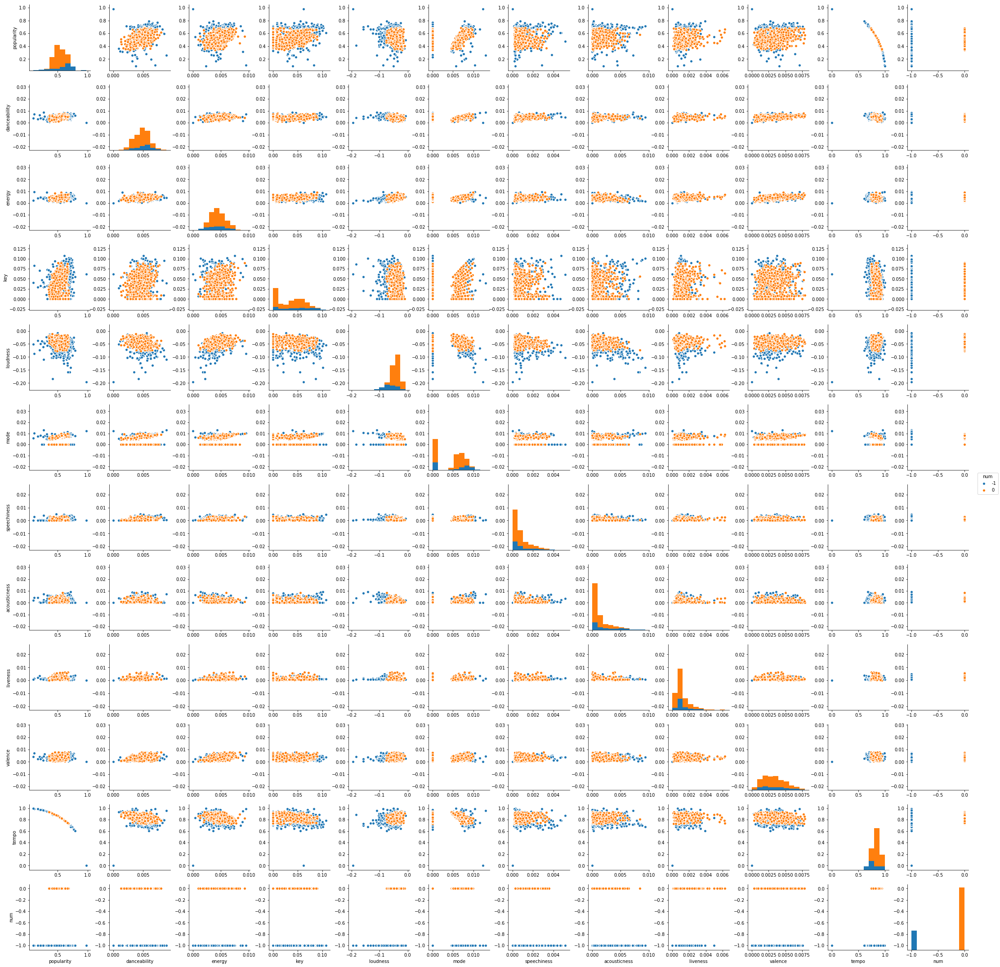

In [98]:
r = pd.concat([data_zs,pd.Series(labels,index=data_zs.index)],axis=1)
r.columns=list(data_zs.columns)+["num"]
sns.pairplot(r,hue="num")

### eps = 0.018

In [99]:
db = DBSCAN(eps=0.018, min_samples=20).fit(data_zs)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_
print(Counter(labels))

Counter({-1: 559, 1: 237, 2: 67, 0: 47, 3: 17})


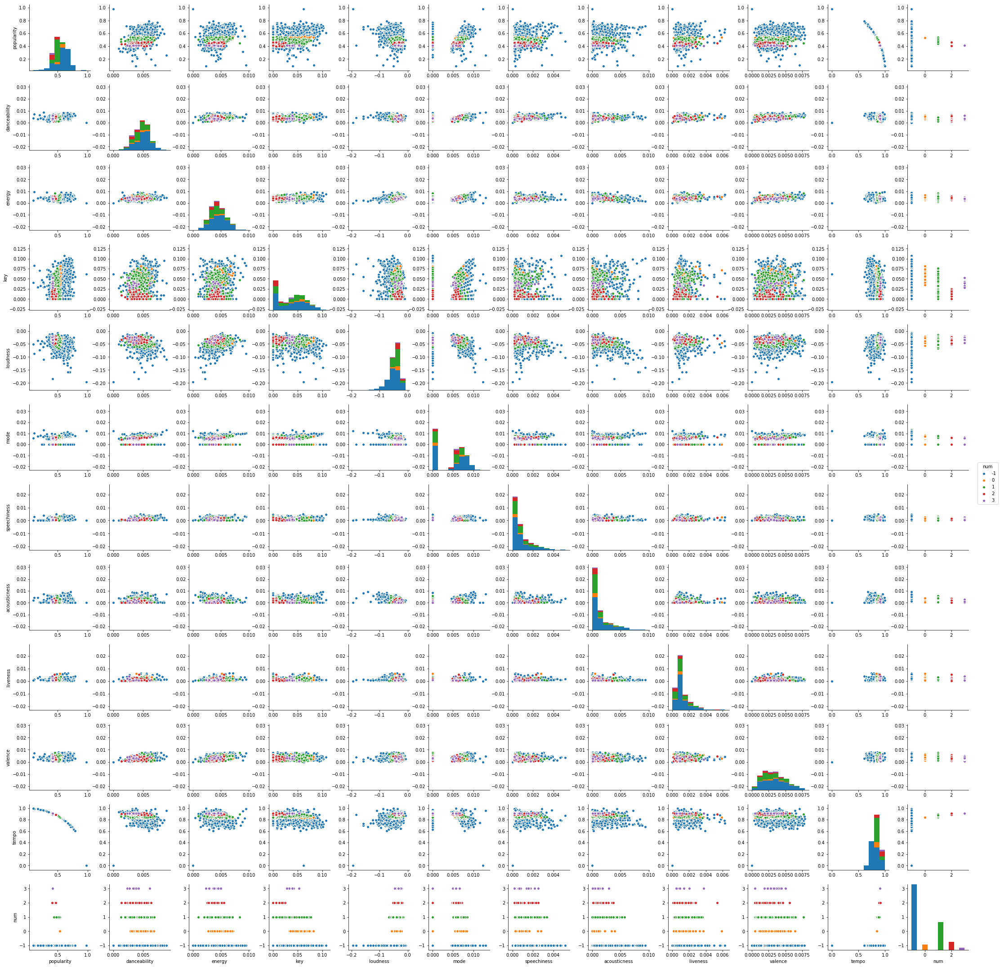

In [100]:
r = pd.concat([data_zs,pd.Series(labels,index=data_zs.index)],axis=1)
r.columns=list(data_zs.columns)+["num"]
sns.pairplot(r,hue="num")

## Mean-shift

In [101]:
bandwidth = estimate_bandwidth(data_zs, quantile=0.22, n_samples=500)
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms.fit(data_zs)
labels = ms.labels_
print(Counter(labels))

Counter({0: 536, 1: 351, 2: 34, 4: 3, 3: 2, 5: 1})


In [102]:
r1 = pd.Series(ms.labels_).value_counts()
r2 = pd.DataFrame(ms.cluster_centers_)
r = pd.concat([r2,r1],axis = 1)
r.columns = list(data.columns)+["num"]
print(r)

   popularity  danceability        energy       key  loudness      mode  \
0    0.494936      0.004565  4.172409e-03  0.035712 -0.042363  0.003742   
1    0.640830      0.005437  5.104204e-03  0.042478 -0.050156  0.005112   
2    0.229674      0.004990  4.306393e-03  0.043205 -0.059593  0.006504   
3    0.097790      0.005384  5.912741e-03  0.061661 -0.069230  0.008065   
4    0.410603      0.004203  2.171872e-03  0.086443 -0.183669  0.000000   
5    0.978679      0.000000  2.490058e-07  0.061942 -0.195439  0.012388   

   speechiness  acousticness  liveness   valence     tempo  num  
0     0.000828      0.001100  0.001146  0.002949  0.865790  536  
1     0.000834      0.001530  0.001234  0.004003  0.763163  351  
2     0.000783      0.001839  0.001795  0.003664  0.969277   34  
3     0.001574      0.003242  0.001026  0.005599  0.990346    2  
4     0.000683      0.003847  0.000817  0.003955  0.888901    3  
5     0.000000      0.000000  0.000000  0.000000  0.000000    1  


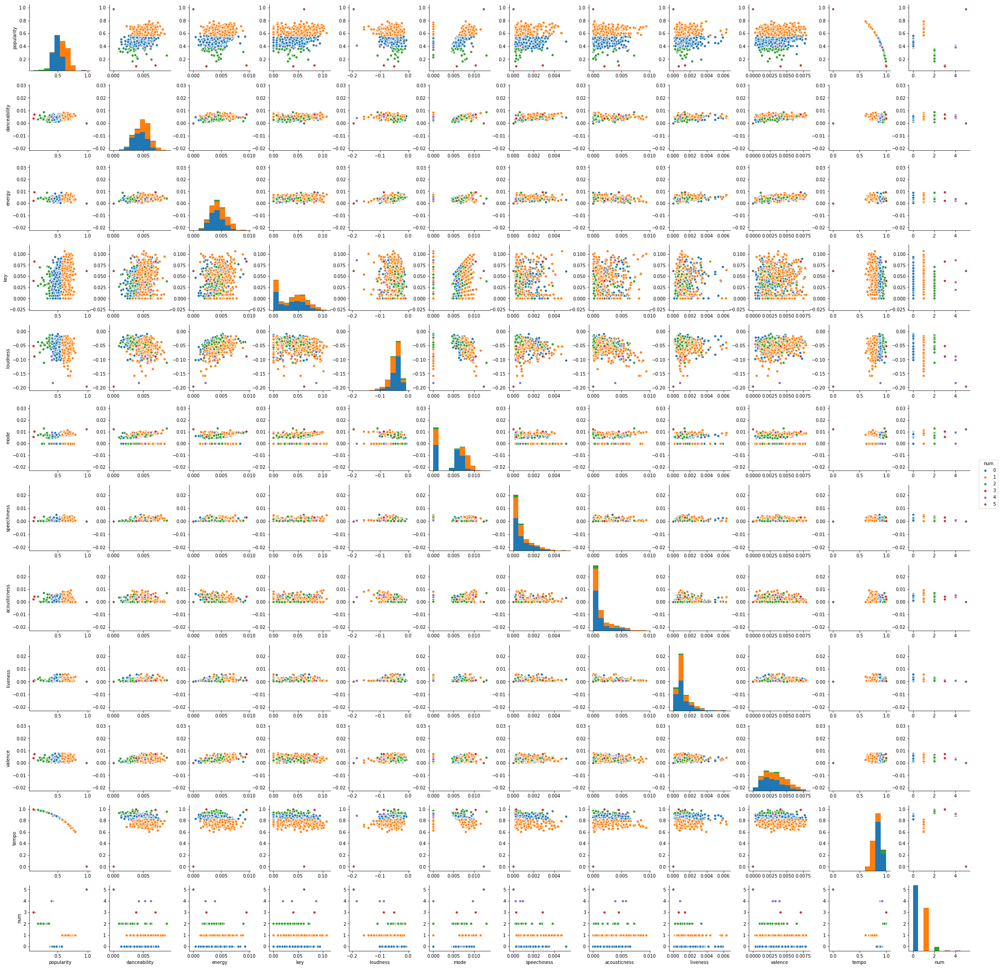

In [103]:
r = pd.concat([data_zs,pd.Series(labels,index=data_zs.index)],axis=1)
r.columns=list(data_zs.columns)+["num"]
sns.pairplot(r,hue="num")

### 1.Do the clustering methods generate the same clusters?
No, as you see from the figure above, you can see that they are differents, no matter you use k_means, DBScan, or Mean-shift, they generate the differents clusters.

### 2. Does scaling effect the clustering?
Yes, the sacling effect the clustering, as you can see from the figure above, when you sacling the data, the clustering becomes differents

### 3.Does the clustering produce interseting groupings?
Yes, when I finished clustering, the k_means method shows that the music id divided by two groups, and they are dependent by the value of "tempo","key" and "popularity"

# PartB.Generate a linear model for your data

In [104]:
data_zs.corr()

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,liveness,valence,tempo
popularity,1.000000,0.475290,0.286244,0.169110,-0.261966,0.118977,0.039164,0.102886,0.071163,0.246577,-0.954288
danceability,0.475290,1.000000,0.208416,0.059983,-0.231507,0.068311,0.239809,-0.001743,0.073455,0.350352,-0.413525
energy,0.286244,0.208416,1.000000,0.110781,0.357520,0.084963,-0.041732,-0.273947,0.199877,0.511842,-0.241036
key,0.169110,0.059983,0.110781,1.000000,-0.130264,-0.092074,0.024217,0.111013,0.073118,0.053966,-0.191510
loudness,-0.261966,-0.231507,0.357520,-0.130264,1.000000,-0.143538,-0.181605,-0.472593,-0.033915,0.119057,0.339346
mode,0.118977,0.068311,0.084963,-0.092074,-0.143538,1.000000,-0.087051,0.139789,0.041686,0.033705,-0.147593
speechiness,0.039164,0.239809,-0.041732,0.024217,-0.181605,-0.087051,1.000000,0.013727,0.108641,-0.028316,-0.050165
acousticness,0.102886,-0.001743,-0.273947,0.111013,-0.472593,0.139789,0.013727,1.000000,-0.007715,0.008535,-0.120947
liveness,0.071163,0.073455,0.199877,0.073118,-0.033915,0.041686,0.108641,-0.007715,1.000000,0.062137,-0.070488
valence,0.246577,0.350352,0.511842,0.053966,0.119057,0.033705,-0.028316,0.008535,0.062137,1.000000,-0.230262


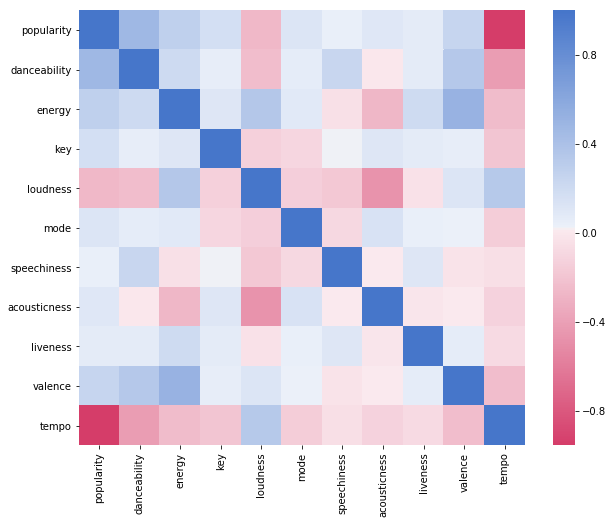

In [105]:
cmap = sns.diverging_palette(0, 255, sep=1, n=256, as_cmap=True)
sns.heatmap(data_zs.corr(), cmap=cmap)

In [106]:
x = data_zs[["tempo"]]
y = data_zs[["popularity"]]
#plt.scatter(x,y)
model=linear_model.LinearRegression()
results = model.fit(x,y)
print(results.intercept_, results.coef_)


[ 1.66199797] [[-1.3540595]]


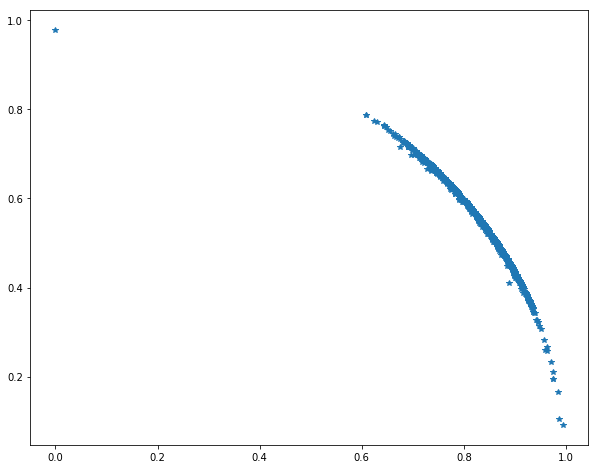

In [107]:
plt.plot(x,y,"*")

                            OLS Regression Results                            
Dep. Variable:             popularity   R-squared:                       0.911
Model:                            OLS   Adj. R-squared:                  0.911
Method:                 Least Squares   F-statistic:                     9429.
Date:                Fri, 16 Feb 2018   Prob (F-statistic):               0.00
Time:                        22:54:55   Log-Likelihood:                 1883.4
No. Observations:                 927   AIC:                            -3763.
Df Residuals:                     925   BIC:                            -3753.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.6620      0.012    143.194      0.0

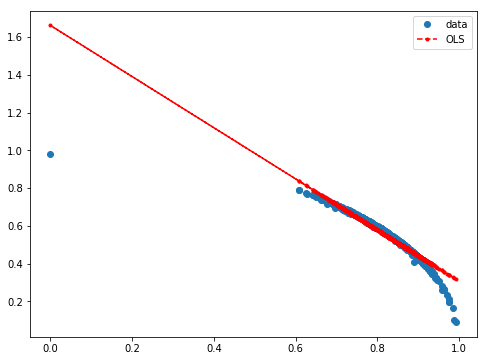

In [108]:
x = data_zs["tempo"]
X = sm.add_constant(x)
y = data_zs["popularity"]
model = sm.OLS(y,X)
results = model.fit()
print(results.summary())
y_fitted =results.fittedvalues
fig, ax = plt.subplots(figsize=(8,6))
ax.plot(x, y, 'o', label='data')
ax.plot(x, y_fitted, 'r--.',label='OLS')
ax.legend(loc='best')


In [109]:
x = data_zs[["tempo","danceability"]]
X = sm.add_constant(x)
y = data_zs["popularity"]
model = sm.OLS(y,X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             popularity   R-squared:                       0.919
Model:                            OLS   Adj. R-squared:                  0.918
Method:                 Least Squares   F-statistic:                     5208.
Date:                Fri, 16 Feb 2018   Prob (F-statistic):               0.00
Time:                        22:54:56   Log-Likelihood:                 1926.0
No. Observations:                 927   AIC:                            -3846.
Df Residuals:                     924   BIC:                            -3832.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            1.5753      0.014    109.344      0.000       1.547       1.604
tempo           -1.2970      0.015    -88.622      0.000      -1.326      -1.268
danceability     8.2746      0.877      9.435      0.000       6.553       9.996
==============================================================================
Omnibus:                     1536.662   Durbin-Watson:                   1.979
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1158346.645
Skew:                         -10.230   Prob(JB):                         0.00
Kurtosis:                     174.962   Cond. No.                     1.14e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.14e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [110]:
x = data_zs[["tempo","danceability","loudness"]]
X = sm.add_constant(x)
y = data_zs["popularity"]
model = sm.OLS(y,X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             popularity   R-squared:                       0.924
Model:                            OLS   Adj. R-squared:                  0.924
Method:                 Least Squares   F-statistic:                     3753.
Date:                Fri, 16 Feb 2018   Prob (F-statistic):               0.00
Time:                        22:54:56   Log-Likelihood:                 1959.8
No. Observations:                 927   AIC:                            -3912.
Df Residuals:                     923   BIC:                            -3892.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            1.6188      0.015    109.041      0.000       1.590       1.648
tempo           -1.3307      0.015    -90.611      0.000      -1.360      -1.302
danceability     9.0309      0.851     10.612      0.000       7.361      10.701
loudness         0.4114      0.049      8.348      0.000       0.315       0.508
==============================================================================
Omnibus:                     1469.489   Durbin-Watson:                   1.981
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           925733.655
Skew:                          -9.374   Prob(JB):                         0.00
Kurtosis:                     156.674   Cond. No.                     1.15e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.15e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [111]:
x = data_zs[["tempo","danceability","loudness","energy"]]
X = sm.add_constant(x)
y = data_zs["popularity"]
model = sm.OLS(y,X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             popularity   R-squared:                       0.924
Model:                            OLS   Adj. R-squared:                  0.924
Method:                 Least Squares   F-statistic:                     2817.
Date:                Fri, 16 Feb 2018   Prob (F-statistic):               0.00
Time:                        22:54:56   Log-Likelihood:                 1960.5
No. Observations:                 927   AIC:                            -3911.
Df Residuals:                     922   BIC:                            -3887.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            1.6085      0.017     93.938      0.000       1.575       1.642
tempo           -1.3244      0.016    -84.996      0.000      -1.355      -1.294
danceability     8.8204      0.868     10.158      0.000       7.116      10.524
loudness         0.3769      0.057      6.620      0.000       0.265       0.489
energy           1.0103      0.833      1.212      0.226      -0.625       2.646
==============================================================================
Omnibus:                     1464.140   Durbin-Watson:                   1.979
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           894937.161
Skew:                          -9.316   Prob(JB):                         0.00
Kurtosis:                     154.072   Cond. No.                     1.26e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.26e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [112]:
x = data_zs[["tempo","danceability","loudness","energy","valence"]]
X = sm.add_constant(x)
y = data_zs["popularity"]
model = sm.OLS(y,X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             popularity   R-squared:                       0.925
Model:                            OLS   Adj. R-squared:                  0.925
Method:                 Least Squares   F-statistic:                     2271.
Date:                Fri, 16 Feb 2018   Prob (F-statistic):               0.00
Time:                        22:54:56   Log-Likelihood:                 1964.2
No. Observations:                 927   AIC:                            -3916.
Df Residuals:                     921   BIC:                            -3887.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            1.6085      0.017     94.266      0.000       1.575       1.642
tempo           -1.3256      0.016    -85.336      0.000      -1.356      -1.295
danceability     9.4658      0.897     10.552      0.000       7.705      11.226
loudness         0.3814      0.057      6.720      0.000       0.270       0.493
energy           2.0252      0.910      2.226      0.026       0.239       3.811
valence         -1.9139      0.701     -2.729      0.006      -3.290      -0.538
==============================================================================
Omnibus:                     1466.902   Durbin-Watson:                   1.961
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           908736.836
Skew:                          -9.347   Prob(JB):                         0.00
Kurtosis:                     155.242   Cond. No.                     1.34e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.34e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [113]:
model = KMeans(n_clusters = 2, n_jobs = 4,max_iter=500)
model.fit(data_zs)
labels = model.labels_
r = pd.concat([data_zs,pd.Series(model.labels_,index=data_zs.index)],axis=1)
r.columns=list(data.columns)+["num"]
print(r)


     popularity  danceability    energy       key  loudness      mode  \
0      0.788199      0.005935  0.003578  0.055174 -0.074784  0.007882   
1      0.715806      0.004375  0.003272  0.058433 -0.046104  0.007304   
2      0.681080      0.004893  0.005970  0.034749 -0.033894  0.000000   
3      0.681949      0.005323  0.003639  0.013917 -0.030152  0.006959   
4      0.510530      0.003117  0.002854  0.026870 -0.035635  0.000000   
5      0.639610      0.005084  0.004589  0.059345 -0.041265  0.000000   
6      0.653638      0.005515  0.005011  0.015026 -0.037535  0.007513   
7      0.427102      0.004048  0.004053  0.009933 -0.027186  0.004966   
8      0.527648      0.003534  0.004304  0.054963 -0.035495  0.005496   
9      0.587574      0.004612  0.005029  0.000000 -0.024623  0.006832   
10     0.463877      0.003184  0.004354  0.000000 -0.025323  0.005271   
11     0.518907      0.003782  0.004157  0.028828 -0.032662  0.000000   
12     0.579116      0.005135  0.003745  0.064346 -

### 1.Is the relationship significant?
Yes, whe I use five attributes "tempo","danceability","loudness","energy","valence" to to the Linear Regression, the model's R-squared is 0.925, and the P-values of all the five attributes is lower than 0.05, which means the relationship is significant

### 2. Are any model assumptions violated?

In [114]:
import statsmodels.api as sm
import scipy.stats as scipystats
x = data_zs[["tempo","danceability","loudness","energy","valence"]]
X = sm.add_constant(x)
y = data_zs["popularity"]
model = sm.OLS(y,X).fit()
model.summary()
aa =pd.Series(model.resid, name = 'resid')

#### Tests for Normality of Residuals

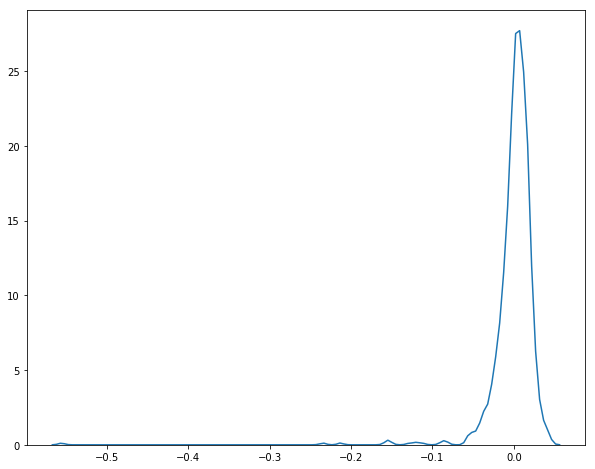

In [115]:
sns.distplot(np.array(aa), hist=False)


In [116]:
scipystats.probplot(aa, dist="norm", plot=pylab)
pylab.show()
norm_resid = (aa - np.mean(aa)) / np.std(aa)
print(scipystats.kstest(norm_resid, 'norm'))

NameError: name 'pylab' is not defined

Since the p-value is lower than 0.05, we can see that residual is not normal distirbution.So it has assumptions violated

### 3 Is there any multi-colinearity in the model
We can use the vif option to check for multicollinearity. vif stands for variance inflation factor. As a rule of thumb, a variable whose VIF values is greater than 10 may merit further investigation. Tolerance, defined as 1/VIF, is used by many researchers to check on the degree of collinearity. A tolerance value lower than 0.1 is comparable to a VIF of 10. It means that the variable could be considered as a linear combination of other independent variables

In [ ]:
from patsy import dmatrices
from statsmodels.stats.outliers_influence import variance_inflation_factor
y, X = dmatrices("popularity ~ tempo + danceability + loudness + energy + valence", data = data_zs, return_type = "dataframe")
vif = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
print (vif)

### 4.In the multiple regression models are predictor variables independent of all the other predictor variables?

In [ ]:
cmap = sns.diverging_palette(0, 255, sep=1, n=256, as_cmap=True)
X = data_zs[["tempo","danceability","loudness","energy","valence"]]
sns.heatmap(X.corr(), cmap=cmap)

we can see that the predictor variables are not independent of all other predictor variables

### 5. Does the model make sense?
I don't know now


### 6.Cross-validate the model. How well did it do?  

## Cross-validation

In [ ]:
X = data_zs[["tempo","danceability","loudness","energy","valence"]]
y = data_zs["popularity"]
X=np.array(X)
y=np.array(y)
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,random_state=0)
clf = LinearRegression()
scores = cross_val_score(clf, X_test, y_test, cv=6)
print(scores)
print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))


## K-Fold cross-validator

In [ ]:
kf = KFold(len(X),n_folds=5)
scores=[]
for train ,test in kf:
    clf = LinearRegression()
    clf.fit(X[train],y[train])
    scores.append(np.sqrt(metrics.mean_squared_error(y[test],clf.predict(X[test]))))
scores


The accuracy is about 96%, so it fit well

### 7.Does regularization help with creating models that validate better on out of sample data

In [ ]:
ridge = Ridge(fit_intercept=True, alpha=0.5)
ridge.fit(X_train,y_train)
y_pred = ridge.predict(X_test)
plt.scatter(y_test, y_pred)
plt.rcParams['figure.figsize'] = (10, 6)
plt.xlabel("popularity: $Y_i$")
plt.ylabel("Predicted popularity: $\hat{y}_i$")
plt.title("Ridge Regression - popularity vs Predicted popularity: $Y_i$ vs $\hat{y}_i$")

In [ ]:
rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
rmse

In [ ]:
kf = KFold(len(X),n_folds=5)
scores=[]
for train ,test in kf:
    clf = LinearRegression()
    clf.fit(X[train],y[train])
    scores.append(np.sqrt(metrics.mean_squared_error(y[test],clf.predict(X[test]))))
scores

In [ ]:
print('Ridge Regression',rmse ,np.mean(scores))

So in this model the regularization do not help creating model that validate better

# Part C: Generate a logistic model

# Checking that the target variable is binary

Since we are building a model to predict the modality (major or minor) of a track, our target is going to be "Whether is mode" variable from the billboard dataframe. To make sure that it's a binary variable,Let's use Seaborn's countplot() function

In [118]:
data = df_bak
#print(data)
data_zs = preprocessing.normalize(data, norm='l2')
data_zs = pd.DataFrame(data_zs)
data_zs.columns=list(data.columns)
aa = df_bak["mode"].tolist()
data_zs["mode"] = aa

#print(data_zs)

In [119]:
#data_zs.dropna(inplace=True)
data_zs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 927 entries, 0 to 926
Data columns (total 11 columns):
popularity      927 non-null float64
danceability    927 non-null float64
energy          927 non-null float64
key             927 non-null float64
loudness        927 non-null float64
mode            927 non-null int64
speechiness     927 non-null float64
acousticness    927 non-null float64
liveness        927 non-null float64
valence         927 non-null float64
tempo           927 non-null float64
dtypes: float64(10), int64(1)
memory usage: 79.7 KB


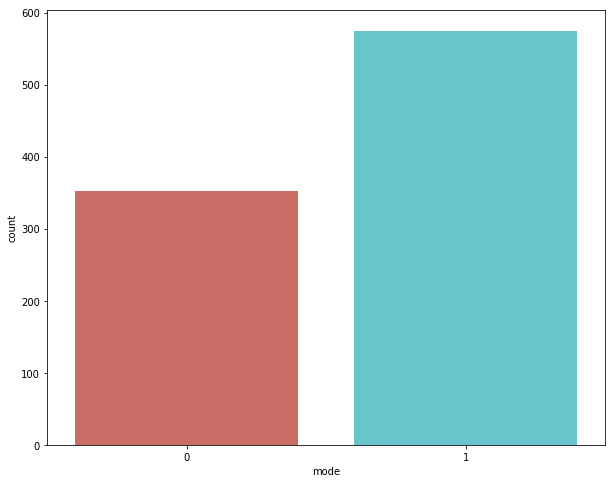

In [120]:
sns.countplot(x='mode',data=data_zs, palette='hls')

And we see that the "mode" variable is binary(Major is represented by 1 and minor is 0)

In [121]:
data_zs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 927 entries, 0 to 926
Data columns (total 11 columns):
popularity      927 non-null float64
danceability    927 non-null float64
energy          927 non-null float64
key             927 non-null float64
loudness        927 non-null float64
mode            927 non-null int64
speechiness     927 non-null float64
acousticness    927 non-null float64
liveness        927 non-null float64
valence         927 non-null float64
tempo           927 non-null float64
dtypes: float64(10), int64(1)
memory usage: 79.7 KB


In [122]:
data_zs.isnull().sum()

popularity      0
danceability    0
energy          0
key             0
loudness        0
mode            0
speechiness     0
acousticness    0
liveness        0
valence         0
tempo           0
dtype: int64

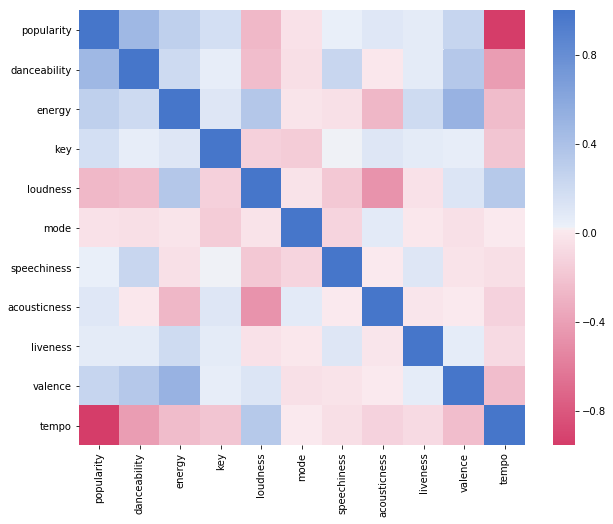

In [123]:
cmap = sns.diverging_palette(0, 255, sep=1, n=256, as_cmap=True)
sns.heatmap(data_zs.corr(), cmap=cmap)

In [124]:
data_zs['intercept']=1.0

In [125]:
pred=["tempo","danceability","loudness","energy","valence","intercept","key","speechiness","acousticness","liveness"]

In [126]:
L_model =sm.Logit(data_zs['mode'],data_zs[pred]).fit()

Optimization terminated successfully.
         Current function value: 0.637027
         Iterations 6


In [127]:
L_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                   mode   No. Observations:                  927
Model:                          Logit   Df Residuals:                      917
Method:                           MLE   Df Model:                            9
Date:                Fri, 16 Feb 2018   Pseudo R-squ.:                 0.04052
Time:                        22:56:02   Log-Likelihood:                -590.52
converged:                       True   LL-Null:                       -615.46
                                        LLR p-value:                 1.139e-07
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
tempo            0.0501      1.151      0.044      0.965      -2.205       2.305
danceability   -34.6470     68.374     -0.507      0.612    -168.658      99.364
loudness        -5.9970      4.689     -1.279      0.201     -15.188       3.194
energy         124.5808     70.241      1.774      0.076     -13.088     262.250
valence        -81.3199     52.549     -1.548      0.122    -184.313      21.673
intercept        0.6640      1.268      0.524      0.601      -1.822       3.150
key            -14.2606      2.716     -5.251      0.000     -19.584      -8.937
speechiness   -294.1542     87.853     -3.348      0.001    -466.342    -121.966
acousticness   129.5301     50.392      2.570      0.010      30.763     228.297
liveness        20.5823     85.219      0.242      0.809    -146.443     187.607
================================================================================
"""

In [128]:
pred=["loudness","valence","intercept","key","acousticness",]
L_model =sm.Logit(data_zs['mode'],data_zs[pred]).fit()
L_model.summary()

Optimization terminated successfully.
         Current function value: 0.645854
         Iterations 6


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                   mode   No. Observations:                  927
Model:                          Logit   Df Residuals:                      922
Method:                           MLE   Df Model:                            4
Date:                Fri, 16 Feb 2018   Pseudo R-squ.:                 0.02722
Time:                        22:56:03   Log-Likelihood:                -598.71
converged:                       True   LL-Null:                       -615.46
                                        LLR p-value:                 9.402e-07
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
loudness        -0.3917      3.833     -0.102      0.919      -7.904       7.120
valence        -40.3663     41.983     -0.961      0.336    -122.652      41.919
intercept        0.9449      0.244      3.865      0.000       0.466       1.424
key            -13.1274      2.616     -5.018      0.000     -18.255      -8.000
acousticness   125.3155     48.035      2.609      0.009      31.168     219.463
================================================================================
"""

In [129]:
pred=["intercept","key","acousticness",]
L_model =sm.Logit(data_zs['mode'],data_zs[pred]).fit()
L_model.summary()

Optimization terminated successfully.
         Current function value: 0.646382
         Iterations 6


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                   mode   No. Observations:                  927
Model:                          Logit   Df Residuals:                      924
Method:                           MLE   Df Model:                            2
Date:                Fri, 16 Feb 2018   Pseudo R-squ.:                 0.02643
Time:                        22:56:03   Log-Likelihood:                -599.20
converged:                       True   LL-Null:                       -615.46
                                        LLR p-value:                 8.645e-08
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
intercept        0.8299      0.130      6.392      0.000       0.575       1.084
key            -13.2281      2.597     -5.093      0.000     -18.319      -8.137
acousticness   127.1941     43.090      2.952      0.003      42.740     211.648
================================================================================
"""

### 1.Is the relationship significant?
Since the p-value of "key" and "acousticness" are lower than 0.05, so the relationship is significant

### 2.Are any model assumptions violated

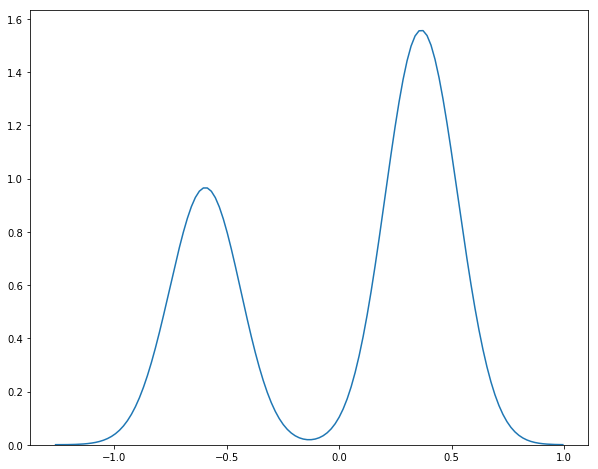

KstestResult(statistic=0.27195672545908645, pvalue=0.0)


In [130]:
import statsmodels.api as sm
import scipy.stats as scipystats
x = data_zs[["key","acousticness"]]
X = sm.add_constant(x)
y = data_zs["mode"]
model = sm.OLS(y,X).fit()
model.summary()
aa =pd.Series(model.resid, name = 'resid')
sns.distplot(np.array(aa), hist=False)
scipystats.probplot(aa, dist="norm")
plt.show()
norm_resid = (aa - np.mean(aa)) / np.std(aa)
print(scipystats.kstest(norm_resid, 'norm'))

Since the p-value is lower than 0.05, we can see that residual is not normal distirbution.So it has assumptions violated

###  3.Cross-validate the model. How well did it do

In [134]:
data = df_bak
#print(data)
data_zs = preprocessing.normalize(data, norm='l2')
data_zs = pd.DataFrame(data_zs)
data_zs.columns=list(data.columns)
aa = df_bak["mode"].tolist()
data_zs["mode"] = aa
X = data_zs[["key","acousticness"]]
y = data_zs["mode"]
X=np.array(X)
y=np.array(y)
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,random_state=0)
clf = LogisticRegression()
clf.fit(X_train, y_train)
scores = cross_val_score(clf, X_test, y_test, cv=6)
print(scores)
print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

[ 0.59574468  0.59574468  0.59574468  0.59574468  0.58695652  0.6       ]
Accuracy: 0.59 (+/- 0.01)


The Accuracy is noly 59%